3.2 Google play app review data analysis and visualization
======

**In this section we use the data from 3.1 to visualise the Google play app review data. Due to the size of the data, in the following examples we run the scripts and visualisation on a subset of the review data first (thumnbsUpCount > 10) to showcase what we can do with the data. Then we will run the python file containing visualisation process for the whole data set to generate chart in html file. Be mindful that it may take a long time and occupy much space depends on the number of reviews for the requested Google play app. Eg, Whatsapp return around 12 millions reviews and 3GB data, the generated html of histogram chart for review score and date is over 320MB.**

**Import required libraries.**

_The following Python modules need to be installed if they are not in the environment (Run all to test if any module is missing) in order to run this notebook (run without ! under command line or with ! in the notebook, for SWAN, see https://support.aarnet.edu.au/hc/en-us/articles/360000668076-How-do-I-add-code-libraries-to-my-Notebook-):_

In [2]:
# comment out to run install, and install other modules with !pip if report missing 
#!pip install plotly


In [1]:
import pandas as pd
import glob, os  

**Read all or subset of csv files to data frame from 3.1 which include review data from the Google play app set in 3.1.** 

In [2]:
#enter path
path = r'./app_name/'   
#read all or selected csv to dataframe
all_csv = glob.glob(os.path.join(path, "*_reviews_*.csv"))   
df = (pd.read_csv(f) for f in all_csv)
df_all   = pd.concat(df, ignore_index=True)

**Check and inspect data frame.**

In [3]:

print(df_all.shape)
print(df_all.head)

(6983109, 10)
<bound method NDFrame.head of                                                   reviewId           userName  \
0        gp:AOqpTOHXltbknstF4xUg-f9nP6KnPPZDZMCZzJz-2bB...        Sri Praveen   
1        gp:AOqpTOFSl74dJdaUpFNDo4-SwXF0v2I8ZAyar6qodZ9...     rajender kumar   
2        gp:AOqpTOGiK0tUsOyG_tBDNHqF08GYRwdrU34DXfLv6n2...    satria ramadhan   
3        gp:AOqpTOHpAvX8MZlGnqPxcXqdPqzf6eeF-8TULjm-wqC...      Najme Ghasemi   
4        gp:AOqpTOHeEJTfvbTUdRyKQdJZtzGo2iizPjXXGLAKoQ6...     Brijesh Keshri   
...                                                    ...                ...   
6983104  gp:AOqpTOFrkSpYUg75IcvIUod-YZnIM62dxEZ2l3Z2TCK...         deep Singh   
6983105  gp:AOqpTOF9L-zw-lAWUe0lZVSPqJaVjiLSYgagvWtlW_m...       suresh kumar   
6983106  gp:AOqpTOFUDqw52r3w0c4phj7Tr8ceynUpYtuPsRhW497...       ujjwal chinu   
6983107  gp:AOqpTOHYoYf-OL_I8g5dQBPIAcMKmryqOR2mOXqstEQ...       Laksh Parakh   
6983108  gp:AOqpTOHSuiBRc2n1_8UKYDuT2EUDx67AZwIZgGwARPY...  jeade

**Create subset of data frame to run in jupyterhub. Depends on the amount of data, running the whole set of data in jupyterhub would be slow and generate very large ipynb file. We will run python file to generate chart and output to html for the whole data set in later section.** 

**Create subset of data frame with thumbsUpCount > 10. Check and inspect data.**

In [4]:
df_sub = df_all[df_all["thumbsUpCount"]>10]
print(df_sub.shape)
print(df_sub.head)

(40536, 10)
<bound method NDFrame.head of                                                   reviewId           userName  \
16667    gp:AOqpTOGAm9DRsNGWrbxNlfI24i5ZPfZ55TYx-8rsOaG...    Marelize Burger   
16719    gp:AOqpTOHxl5dXZKvyN4mqzoroMdGk3eax9-iME9z-Pk-...     Ramkeval Yadav   
16891    gp:AOqpTOFUQH5GbD2a25kohYUe-bHOeP1Nkc8RyzALZxV...        Vikas Kohli   
16900    gp:AOqpTOHKfASlzMfcXj2MrAKT3pvJTWB7STwClEFVFR7...     Rebecca Dsouza   
17041    gp:AOqpTOHDkWVRB2WOGuOh7zfHESrBknktgCczdgzWCr_...       Subhojit Dey   
...                                                    ...                ...   
6982249  gp:AOqpTOEiYlmq6PG1w_rcI-aH-5MG2lpGKfqIQHMJceH...       Abhay Pandey   
6982261  gp:AOqpTOGa3Y9iQIMOzu32yuW2dcV0RYSonD0Uky5LdbR...  Hair Wizard Salon   
6982615  gp:AOqpTOGv7zuty37LlLQTGTYOnEeb4cqqcstiYcmLO05...      A Google user   
6982819  lg:AOqpTOHyGy2AQ2AJzJSfVkpDlOOYGOH2ATH78dA1_7j...      A Google user   
6983011  gp:AOqpTOG00IO8w_HOHECHMIbkn0N1NWtWEbqlE1vY91G...      A G

In [5]:
print(df_sub.dtypes)

reviewId                 object
userName                 object
userImage                object
content                  object
score                     int64
thumbsUpCount             int64
reviewCreatedVersion     object
at                       object
replyContent            float64
repliedAt               float64
dtype: object


**import plotly packages for interactive charts.**

In [6]:
# import plotly express package for interactive charts
import plotly
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "plotly_mimetype+notebook_connected"

**Create interactive histogram chart for review score and date counts distribution.**

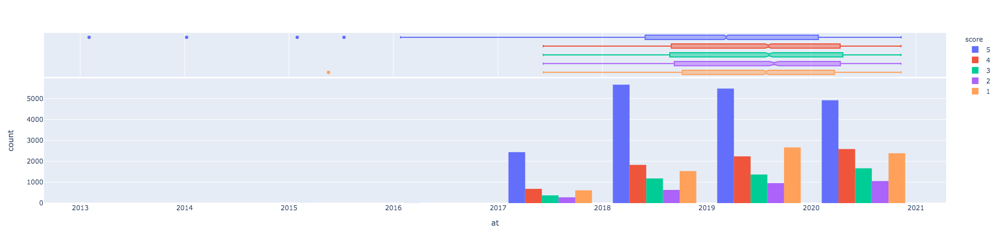

In [7]:
# Histogram chart for Score, date data counts
fig = px.histogram(df_sub, x='at', nbins=15, color="score",marginal='box',barmode='group',category_orders={"score":[5,4,3,2,1]})
fig.show()
#output chart to html
#plotly.offline.plot(fig, filename='3.4.histogram01.html')


**Create interactive scatter chart for review score, thumbsUpCount and date counts distribution.**

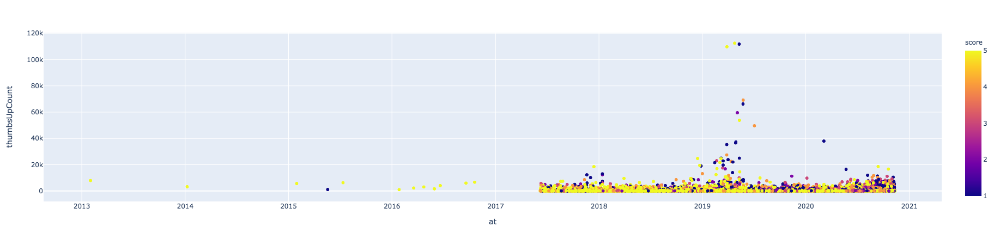

In [8]:
# Scatter chart for score, thumbsUpCount, date data distributions
fig = px.scatter(df_sub, x='at', y='thumbsUpCount', color='score')
fig.update_xaxes(type='date')
fig.show()

**Create interactive scatter chart for review score and date counts distribution.**

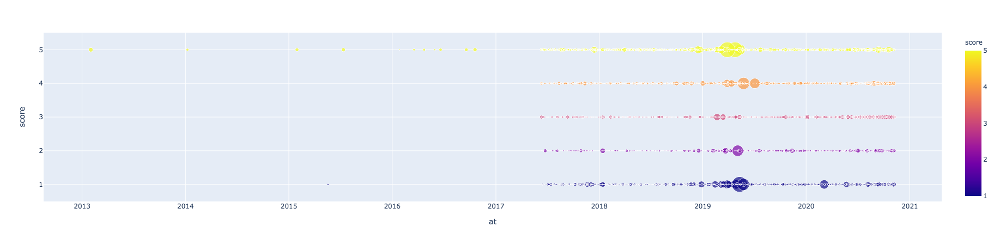

In [9]:
# Scatter chart for score and date data distributions
fig = px.scatter(df_sub, x='at', y='score', color='score', size='thumbsUpCount')
fig.show()

**Create interactive 3D scatter chart for review score, thumbsUpCount and date counts distribution.**

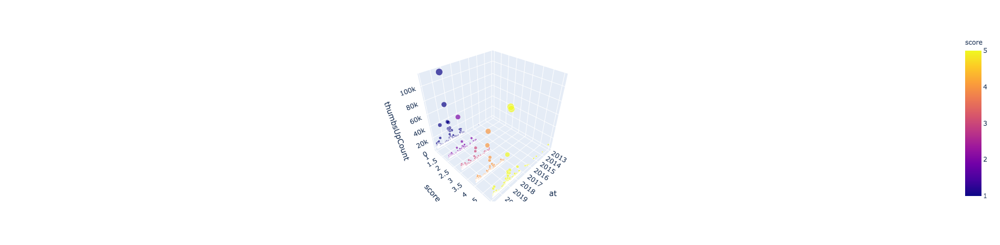

In [10]:
# Scatter chart for score, thumbsUpCount and date data distributions
fig = px.scatter_3d(df_sub, x='at', y='score', z='thumbsUpCount',color='score', size='thumbsUpCount')
fig.show()

**Run python file for the whole data set to generate chart in html file. Be mindful that it may take a long time and occupy much space depends on the number of reviews for the requested Google play app. Eg, Whatsapp return around 12 millions reviews and 3GB data, the generated html of histogram chart for review score and date is over 320MB.**

In [1]:
%run googleplay_all.py